Plot fit error distributions from different model fits to Baker et al data

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from scipy.io import loadmat

import record_0_main as rcd_0
import record_1_ma_ext as rcd_1
import record_2_lin_ln as rcd_2

from aux import get_seg
from disp import set_plot, set_font_size, plot_b

FPS = 30.03
DT = 1/FPS

NNRN = 224

EXPT_DIR = 'data/original/pacheco_neur'
# MAT_FILE = 'median_auditory_responses_wildtype.mat'
MAT_FILE = 'median_auditory_responses_wildtype_plus_naturalsong.mat'

In [2]:
temp = loadmat(os.path.join(EXPT_DIR, MAT_FILE))['dataset']
d = dict(zip([k for k, v in temp.dtype.descr], temp[0, 0]))

print(d['median_z_scored_signal_per_roi'].shape)  # num rois (aggregated over flies) x num timesteps
med_rsp = d['median_z_scored_signal_per_roi']

npl_names = d['neuropil_full_names'].flatten()
stim_index = d['stimuli_index_vector'].flatten()

(2258, 244)


In [3]:
npl_names

array([array(['AMMC'], dtype='<U4'), array(['SAD'], dtype='<U3'),
       array(['GNG'], dtype='<U3'), array(['WED'], dtype='<U3'),
       array(['AVLP'], dtype='<U4'), array(['PVLP'], dtype='<U4'),
       array(['PLP'], dtype='<U3'), array(['AOTU'], dtype='<U4'),
       array(['AL'], dtype='<U2'), array(['MB_VL'], dtype='<U5'),
       array(['MB_ML'], dtype='<U5'), array(['MB_PED'], dtype='<U6'),
       array(['MB_CA'], dtype='<U5'), array(['LH'], dtype='<U2'),
       array(['EB'], dtype='<U2'), array(['FB'], dtype='<U2'),
       array(['PB'], dtype='<U2'), array(['NO'], dtype='<U2'),
       array(['BU'], dtype='<U2'), array(['LAL'], dtype='<U3'),
       array(['SLP'], dtype='<U3'), array(['SIP'], dtype='<U3'),
       array(['SMP'], dtype='<U3'), array(['CRE'], dtype='<U3'),
       array(['SCL'], dtype='<U3'), array(['ICL'], dtype='<U3'),
       array(['IB'], dtype='<U2'), array(['ATL'], dtype='<U3'),
       array(['VES'], dtype='<U3'), array(['EPA'], dtype='<U3'),
       array(['GOR']

In [4]:
stims = [None] + [stim[0] for stim in d['stimuli_name_string'].flatten()]
n_stim = len(stims)-1
stims

[None, 'Pulse', 'Sine', 'White Noise', 'Natural Song']

In [5]:
bds = [None]

for istim in range(1, len(stims)):
    segs, bds_seg = get_seg(stim_index==istim, min_gap=1)
    bds.append(bds_seg[0])
    
print(bds)

bd_s = bds[2]
bd_p = bds[1]

[None, array([20, 41]), array([ 81, 102]), array([142, 163]), array([203, 224])]


In [6]:
flies = np.unique(d['fly_index_per_roi'])
mflys = [(d['fly_index_per_roi'] == fly).flatten() for fly in flies]

expts = []
npl_idxs = []

for fly, mfly in zip(flies, mflys):
    print(f'Fly {fly}: {mfly.sum()} rois')
    expts.append(med_rsp[mfly, :])
    npl_idxs.append(d['neuropil_index_per_roi'].flatten()[mfly])
    
print()

for fly, expt in zip(flies, expts):
    print(f'Fly {fly}: {expt.shape}')

Fly 38: 210 rois
Fly 39: 697 rois
Fly 40: 382 rois
Fly 41: 948 rois
Fly 42: 21 rois

Fly 38: (210, 244)
Fly 39: (697, 244)
Fly 40: (382, 244)
Fly 41: (948, 244)
Fly 42: (21, 244)


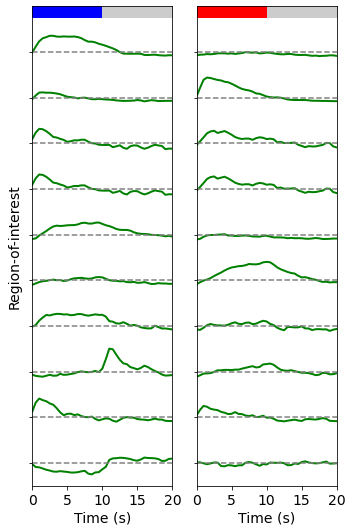

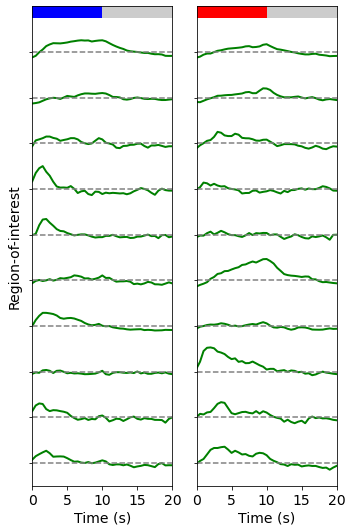

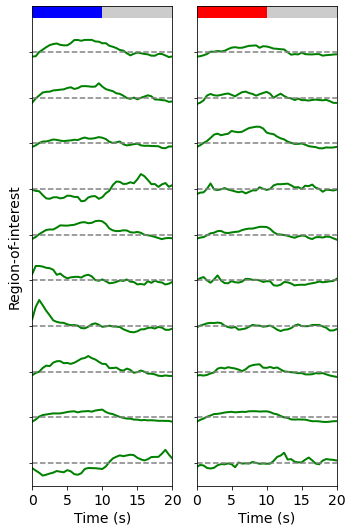

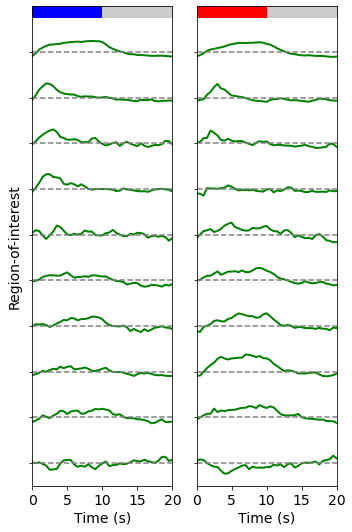

In [7]:
rois_plot_all = [
    [ (0, 13), (0, 16), (0, 28), (0, 28), (0, 34), (0, 17), (0, 9), (0, 61), (0, 75), (0, 120)],
    [ (1, 20), (1, 10), (1, 23), (1, 98), (1, 125), (1, 133), (1, 193), (1, 192), (1, 196), (1, 129)],
    [ (2, 12), (2, 23), (2, 50), (2, 71), (2, 183), (2, 174), (2, 168), (2, 136), (2, 122), (2, 75)],
    [ (3, 177), (3, 185), (3, 194), (3, 199), (3, 123), (3, 113), (3, 82), (3, 33), (3, 28), (3, 15)],
]

for cfig, rois_plot in enumerate(rois_plot_all):
    
    nplot = len(rois_plot)
    
    fig, axs = plt.subplots(1, 2, figsize=(5, nplot*.75), tight_layout=True, sharey=True)
    
    y_ticks = []

    for croi, (ifly, iroi) in enumerate(rois_plot):
        y_tick = -4*croi
        
        # sine
        r = expts[ifly][iroi, :][bd_s[0]:bd_s[1]+20]
        t_s = np.arange(len(r))*.5
        axs[0].plot(t_s, r/2+y_tick, c='green', lw=2)

        axs[0].axhline(y_tick, c='gray', ls='--')
        
        # pulse
        r = expts[ifly][iroi, :][bd_p[0]:bd_p[1]+20]
        t_p = np.arange(len(r))*.5
        axs[1].plot(t_p, r/2+y_tick, c='green', lw=2)

        axs[1].axhline(y_tick, c='gray', ls='--')

        y_ticks.append(y_tick)

    b_s = np.zeros(len(t_s))
    b_s[t_s < 10] = 1

    plot_b(axs[0], t_s, b_s, extent=[t_s[0], t_s[-1]+.5, 3, 4], c=[(.8, .8, .8), 'b', 'r'])
    
    b_p = np.zeros(len(t_p))
    b_p[t_p < 10] = 2

    plot_b(axs[1], t_p, b_p, extent=[t_s[0], t_s[-1]+.5, 3, 4], c=[(.8, .8, .8), 'b', 'r'])

    axs[0].set_ylabel('Region-of-interest')

    y_tick_labels = []
    for ax in axs:
        set_plot(ax, x_lim=(0, 20), y_lim=(-4*nplot+2, 4), y_ticks=y_ticks, y_tick_labels=y_tick_labels, x_label='Time (s)', font_size=14)
        
    fig.savefig(f'supp/fig_s1_pacheco_xpls_{cfig}.svg')

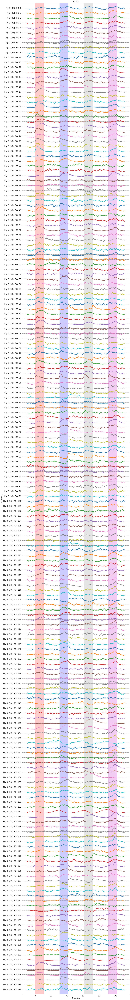

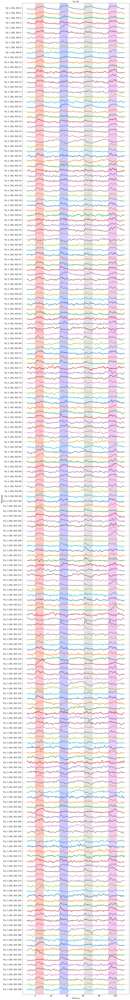

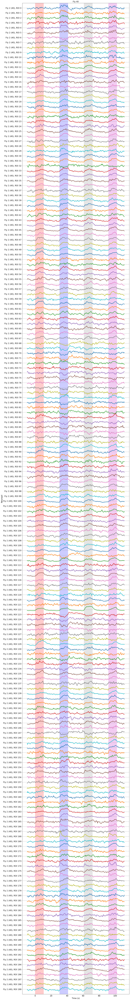

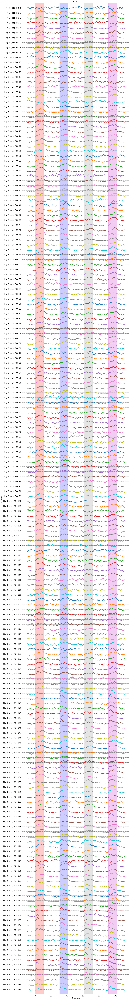

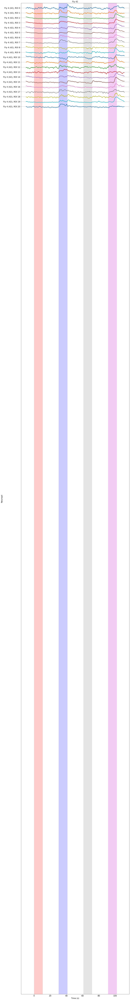

In [8]:
nroi = 200

for ifly in range(5):
    y_ticks = []
    y_tick_labels = []
    t = -10 + np.arange(len(d['timestamps'].flatten()))*.5

    fig, ax = plt.subplots(1, 1, figsize=(15, nroi/1.75), tight_layout=True)
    for ctr in range(nroi):
        if len(expts[ifly]) > ctr:
            ax.axhline(4*ctr, lw=1, ls='--', c='gray')
            ax.plot(t, -expts[ifly][ctr, :] + 4*ctr, lw=3)
            
            y_ticks.append(4*ctr)
            if npl_idxs[ifly][ctr] < len(npl_names):
                npl_name = npl_names[npl_idxs[ifly][ctr]][0]
            else:
                npl_name = ''
            # y_tick_labels.append(npl_name)
            y_tick_labels.append(f'Fly {ifly} ({flies[ifly]}), ROI {ctr}')

    colors = [None, 'r', 'b', 'gray', 'm']
    for cstim, stim in enumerate(stims[1:], 1):
        start, end = bds[cstim]
        ax.axvspan(t[start], t[end], color=colors[cstim], alpha=.2)

    ax.set_ylim(4*nroi, -4)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Neuropil')
    ax.set_title(f'Fly {flies[ifly]}')
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(y_tick_labels)

    set_font_size(ax, 16)